In [1]:
import pickle
import typing
import json
from copy import deepcopy
from functools import partial

import tensorflow as tf
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS, LocallyLinearEmbedding
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from utils.game_utils import GymState
import Agents
from Main import MNet, game_from_name, DotDict
from Games.Game import Game
from utils.loss_utils import support_to_scalar
import MuZero
from MuZero.MuCoach import MuZeroCoach
from Coach import Coach

Using TensorFlow backend.


In [2]:
import plotly.io as pio
pio.renderers

Renderers configuration
-----------------------
    Default renderer: 'plotly_mimetype+notebook'
    Available renderers:
        ['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode',
         'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab',
         'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg',
         'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe',
         'iframe_connected', 'sphinx_gallery', 'sphinx_gallery_png']

## Trained Model I/O

In [3]:
def load_run(config_file: str, game_id: str) -> typing.Tuple[DotDict, Game, MNet]:
    c = DotDict.from_json(config_file)
    g = game_from_name(game_id)
    
    net = MNet(g, c.net_args, c.architecture)
    net.load_checkpoint(c.args.load_folder_file[0], c.args.load_folder_file[1])
    
    return DotDict(file=config_file, config=c, game=g, net=net)


load_mc_run = partial(load_run, game_id='gym_MountainCar-v0')

In [44]:
my_runs = DotDict(
    l4_kl=load_mc_run("out/mc_out/latent_4_kl/MC_Base_kl_Gym_gym_MountainCar-v0_20201204-070332.json"),
    l8_kl=load_mc_run("out/mc_out/latent_8_kl//MC_Base_kl_Gym_gym_MountainCar-v0_20201130-111910.json"),
    l4=load_mc_run("out/mc_out/latent_4/MC_Base_Gym_gym_MountainCar-v0_20201203-204117.json"),
    l8=load_mc_run("out/mc_out/latent_8/MC_Base_Gym_gym_MountainCar-v0_20201130-111621.json")
)

my_runs.l4_kl.experiment = 'out/mc_out/latent_4_kl/MC_BlindfoldMuZero_l4_20201205-114013'
my_runs.l8_kl.experiment = 'out/mc_out/latent_8_kl//MC_BlindfoldMuZero_kl_20201201-101835'
my_runs.l4.experiment = 'out/mc_out/latent_4/MC_BlindfoldMuZero_l4_20201205-113219'
my_runs.l8.experiment = 'out/mc_out/latent_8/MC_BlindfoldMuZero_20201201-103309'

## State Space Enumeration and Embedding

In [5]:
def create_grid(v_mins: typing.List, v_maxs: typing.List, resolution: int) -> np.ndarray:
    data = list(map(lambda r: np.linspace(*r, resolution), zip(v_mins, v_maxs)))
    grid = np.asarray(np.meshgrid(*data)).T.reshape(-1, len(v_mins))
    return grid


def get_state_space(g: Game, resolution: int = 25) -> np.ndarray:
    obs_space = g.getInitialState().env.observation_space
    state_space = create_grid(obs_space.low, obs_space.high, resolution)
    return state_space


def embedding_manifold(state_space: np.ndarray, net: MNet, return_pis: bool = False) -> typing.Tuple:
    if len(state_space.shape) != 4:
        state_space = state_space[:, np.newaxis, np.newaxis, :]
        
    s, pis, vs = net.neural_net.forward.predict(state_space, batch_size=512)
   
    v_reals = support_to_scalar(vs, (vs.shape[-1] - 1) / 2)
    s = s.reshape(len(state_space), -1)

    if return_pis:
        return s, v_reals, pis
    
    return s, v_reals


In [158]:
delta = 200
state_space = get_state_space(my_runs.l4.game, delta)

s, vs, *pis = embedding_manifold(state_space, my_runs.l4.net)

print(state_space.shape, s.shape)

(40000, 2) (40000, 4)


## PCA 

In [7]:
def embedding_PCA(latent_states: np.ndarray, standardize: bool = False):   
    x = latent_states
    if standardize:
        x = (x - x.mean(axis=0)) / x.std(axis=0)
    
    # Perform PCA on latent dimensions
    pca = PCA(n_components=x.shape[-1])
    pca.fit(x)
    spcs = pca.fit_transform(x)
    
    # Create barchart
    ns = list(range(x.shape[-1]))
    var = pca.explained_variance_ratio_
    
    bar = plt.bar(ns, var)
    
    plt.title(f"PCA on latent-states (standardize={standardize})")
    plt.ylabel("Explained Variance Ratio")
    plt.xlabel("Principal Component")
    
    
    for i in range(len(var)):
        plt.annotate(f'{var[i]:.3f}', xy=(ns[i],var[i]), ha='center', va='bottom')

    plt.show()
    
    # Create violinplot
    plt.violinplot(spcs)
    plt.xticks(range(1, x.shape[-1]+1), range(1, x.shape[-1]+1))
    
    plt.title(f"Projected values distribution (standardize={standardize})")
    plt.ylabel("PC values")
    plt.xlabel("Principal Component")
    
    plt.show()
    
    return pca

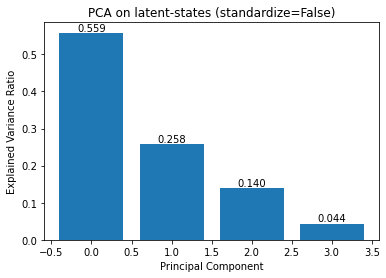

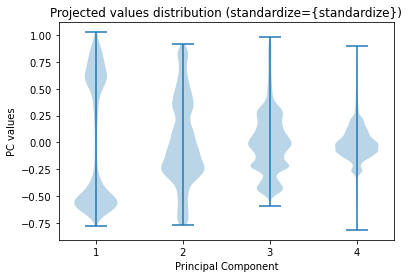

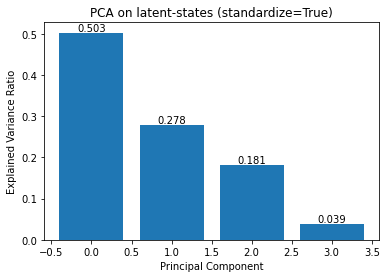

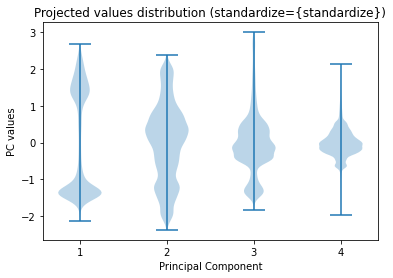

In [159]:
pca = embedding_PCA(s, False)
pca_norm = embedding_PCA(s, True)

pcs = pca.transform(s)

## Simple Helper Plots

In [11]:
def to_grid(x: np.ndarray, delta: int) -> np.ndarray:
    return x.reshape(delta, delta)


def simple_PC_value_contour(pc_1: np.ndarray, pc_2: np.ndarray, z: np.ndarray) -> None:
    plt.scatter(pc_1, pc_2, c=z, alpha=0.5, s=5, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')

    plt.title("Value Contour MuZero PC-Space")
    plt.ylabel(r"First PCA component $h_\theta(o_t)$")
    plt.xlabel(r"Second PCA component $h_\theta(o_t)$")


def simple_MC_value_contour(x: np.ndarray, y: np.ndarray, z: np.ndarray) -> None:
    # Simple Example Figure for a 2-d env
    plt.title("Value Contour MuZero MountainCar")
    plt.ylabel("Velocity")
    plt.xlabel("Position")

    plt.contourf(x, y, z, levels=100, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')
    

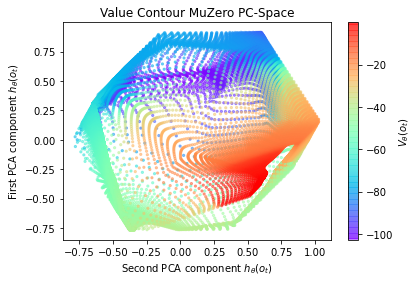

In [14]:
simple_PC_value_contour(pcs[:, 0], pcs[:, 1], vs)
plt.show()

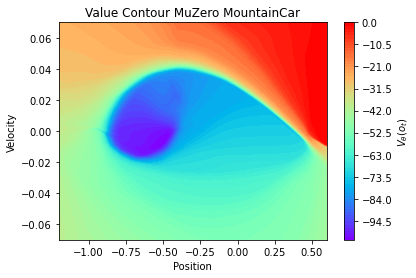

In [12]:
simple_MC_value_contour(to_grid(state_space[:,0], delta), to_grid(state_space[:,1], delta), to_grid(vs, delta))
plt.show()

## Abstract State Space Enumeration for PC-Space

In [35]:
def project_latents(pca: PCA, net: MNet, resolution: int = 25):
    dims = np.prod(net.neural_net.encoder.output.shape[1:])
    
    latent_grid = create_grid(np.zeros(dims), np.ones(dims), resolution)
    
    pis, vs = net.neural_net.predictor.predict(latent_grid[..., np.newaxis], batch_size=512, verbose=1)
    
    acts = np.argmax(pis, axis=-1)

    a_planes = np.zeros_like(pis)
    a_planes[np.arange(len(pis)), acts] = 1
    
    rs, _ = net.neural_net.dynamics.predict([latent_grid[..., np.newaxis], a_planes], batch_size=512, verbose=1)
    
    # Cast distributional bins back to scalar values.
    vs = support_to_scalar(vs, (vs.shape[-1] - 1) / 2)
    rs = support_to_scalar(rs, (rs.shape[-1] - 1) / 2)
    
    projected_states = pca.transform(latent_grid)
    
    return projected_states, vs, rs

In [160]:
p_grid, p_vs, p_rs = project_latents(pca, my_runs.l4.net, delta // 16)

20736/20736 [==============================] - 0s 3us/step


## Trajectory Generation with MDP Observation Sparsity

In [161]:
def load_experiment(experiment_file: str, net: MNet) -> DotDict:
    with open(experiment_file + '.out', 'rb') as f:
        history = pickle.load(f)
      
    data = DotDict()
    for run in history:
        k, *_= run.keys()
        v = run.values()
        
        observations = list()
        actions = list()
        embeddings = list()
        
        for trajectory in list(*v):
            if len(trajectory) > 0:
                obs = np.asarray(trajectory.observations)
                acts = np.asarray(trajectory.actions)
                
                observations.append(obs)
                actions.append(acts)
                
                # Projected trajectories -- h(o_t). Not equal to latent trajectories!
                embeddings.append(net.neural_net.encoder.predict(obs, batch_size=512))
        
        data[k] = DotDict(observations=observations, actions=actions, embeddings=embeddings)
        
    # Update JSON data
    args = DotDict.from_json(experiment_file + '.json')
    
    players = DotDict()
    for p in args.args.players:
        players[p.name + '_' + str(p.config.refresh_freq)] = p
    
    results = DotDict()
    for r in args.results:
        results[r.player] = r
        
    args.args.players = players
    args.results = results
        
    return data, args


def get_latent_trajectory(embeddings: np.ndarray, actions: np.ndarray, g: Game, net: MNet, refresh_freq: int) -> np.ndarray:
    memory = embeddings[0][np.newaxis,...]
    
    latent_states = list()
    for i in range(len(embeddings)):
        if i % refresh_freq == 0:
            s = embeddings[i][np.newaxis, ...]
        else:
            # One hot encoding
            a = np.zeros((1, g.getActionSize()))
            a[:, actions[i]] = 1
            
            r, s = net.neural_net.dynamics.predict([memory, a])
        
        memory = s
        latent_states.append(s)
        
    stacked = np.concatenate(latent_states)
    return stacked

In [162]:
trajectories, args = load_experiment(my_runs.l4.experiment, my_runs.l4.net)

In [163]:
x = 1
sample = trajectories.r0c1_BlindMuZeroPlayer_MC_Base
sample_trajectory = get_latent_trajectory(sample.embeddings[x], sample.actions[x], my_runs.l4_kl.game, my_runs.l4.net, 200)

# Project to PC-space
pc_embedding_trajectory = pca.transform(sample.embeddings[x].reshape(len(sample.embeddings[x]), -1))
pc_dynamics_trajectory = pca.transform(sample_trajectory.reshape(len(sample_trajectory), -1))

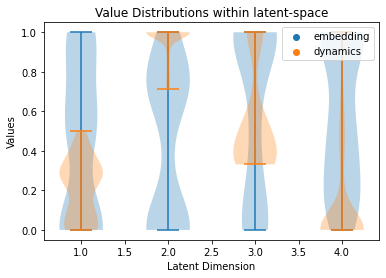

In [164]:
plt.violinplot(sample.embeddings[x].reshape(len(sample.embeddings[x]), -1), np.arange(1, 5))
plt.violinplot(sample_trajectory.reshape(len(sample_trajectory), -1), np.arange(1, 5))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within latent-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")

plt.legend()
plt.show()

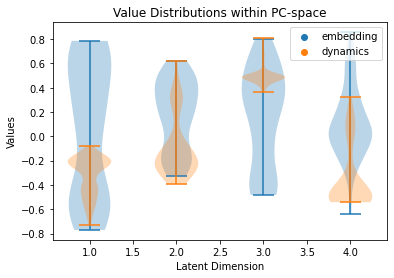

In [165]:
plt.violinplot(pc_embedding_trajectory, np.arange(1, 5))
plt.violinplot(pc_dynamics_trajectory, np.arange(1, 5))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within PC-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")

plt.legend()
plt.show()

## Trajectory and Abstract MDP Visualization in Plotly

In [429]:
def generate_3d_surface(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray):
    return go.Surface(
        x=x, y=y, z=z,
        opacity=1, 
        surfacecolor=colors,
        colorscale='Plasma',
        cmin=colors.min(),
        cmax=colors.max(),
        colorbar=dict(title=dict(text='V',side='top'), thickness=50, tickmode='array')
    )

def generate_3d_trajectory(x: np.ndarray, y: np.ndarray, z: np.ndarray, color: str):
    return go.Scatter3d(
        x=x + np.random.rand()*0.01,
        y=y + np.random.rand()*0.01,
        z=z + np.random.rand()*0.01,
        mode='lines+markers',
        marker=dict(
            size=3,
            symbol='x',
            color=color,
            opacity=1
        ),
        line=dict(
            color=color,
            width=10
        )
    )

def generate_3d_valuefield(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray):
    return go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=4,
            color=colors,
            colorscale='Plasma',
            cmin=colors.min(),
            cmax=colors.max(),
            opacity=0.08
        )
    )

In [476]:
embedding_trajectory =  generate_3d_trajectory(
    pc_embedding_trajectory[:, 0],
    pc_embedding_trajectory[:, 1], 
    pc_embedding_trajectory[:, 2], 'grey')

dynamics_trajectory = generate_3d_trajectory(
    pc_dynamics_trajectory[:, 0], 
    pc_dynamics_trajectory[:, 1], 
    pc_dynamics_trajectory[:, 2], 'black')

surface = generate_3d_surface(to_grid(pcs[:,0], delta), to_grid(pcs[:,1], delta), 
                              to_grid(pcs[:,2], delta), to_grid(vs, delta))

cube = generate_3d_valuefield(p_grid[:, 0], p_grid[:, 1], p_grid[:, 2], p_vs)

fig = go.Figure(data=[cube, embedding_trajectory, dynamics_trajectory, surface])


# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()

## Data Generation Pipeline

In [122]:
def generate_data(my_run_name: str, my_run: DotDict, delta: int, dynamics_sparsities: typing.Tuple[int, ...]):
    # Generate encoder embedding
    obs_space = my_run.game.getInitialState().env.observation_space
    state_space = get_state_space(my_run.game, delta)
    s, vs, *pis = embedding_manifold(state_space, my_run.net)
    
    # Project embedding to non-standardized PC-space (latent dimensions are uniformly scaled).
    pca = embedding_PCA(s, False)
    pcs = pca.transform(s)
    
    # Project entire internal MuZero MDP to the fitted PC-space.
    delta_cube = int(np.log(1e5) / np.log(s.shape[-1]))  # Number of points = delta^dims --> delta = log_dims(number of points)
    p_grid, p_vs, p_rs = project_latents(pca, my_run.net, delta_cube)
    
    # Get control trajectories from experiment.
    trajectories, args = load_experiment(my_run.experiment, my_run.net)
    
    i = 0
    trajectory_collect = list()
    for run_key, config_key in zip(trajectories.keys(), args.args.players.keys()):
        print(run_key, config_key)
        trajectory_data = DotDict()
        
        trajectory_data.test_sparsity = args.args.players[config_key].config.refresh_freq
        trajectory_data.rewards = args.results[run_key].trial_result
        
        trajectory_data.states = [x.tolist() for x in trajectories[run_key].observations]
        trajectory_data.embeddings = list(map(lambda x: pca.transform(x.reshape(len(x), -1)).tolist(), sample.embeddings))
        
        trajectory_data.dynamics = list()
        
        for sparsity in dynamics_sparsities:
            collection = DotDict()
            
            dynamics = list()
            for embedding_trajectory, action_trajectory in zip(trajectories[run_key].embeddings, trajectories[run_key].actions):
                trajectory = get_latent_trajectory(embedding_trajectory, action_trajectory, my_run.game, my_run.net, sparsity)
                dynamics.append(pca.transform(trajectory.reshape(len(trajectory), -1)).tolist())
                
            collection.values = dynamics
            collection.test_sparsity = sparsity
                
            trajectory_data.dynamics.append(collection)
        
        # Finally store dynamics trajectories in container.
        trajectory_collect.append(trajectory_data)
        if i == 1:
            break
        i += 1
    
    container = {
        'environment': my_run.game.env_name,
        'input_domain': [obs_space.low.tolist(), obs_space.high.tolist()],
        'manifold': {
            'embedding': pcs.tolist(),
            'colors': { 'value': vs.tolist() }
        },
        'hypercube': {
            'embedding': p_grid.tolist(),
            'colors': {
                'hypercube_value': p_vs.tolist(),
                'hypercube_reward': p_rs.tolist()
            }
        },
        'trajectories': trajectory_collect 
    }
            
    
    return container

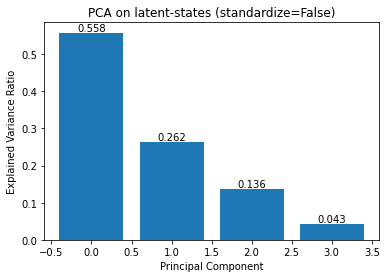

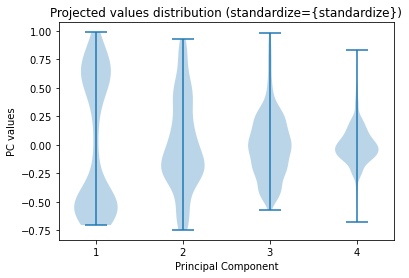

4096/4096 [==============================] - 0s 4us/step
r0c0_BlindMuZeroPlayer_MC_Base BLIND_MUZERO_1
r0c1_BlindMuZeroPlayer_MC_Base BLIND_MUZERO_5


In [123]:
data = generate_data('kl', my_runs.l4, 25, [1, 10])

## Plot Data I/O

In [124]:
with open("embedding_01.json", "w") as f:
    json.dump(data, f)

## Illustrative example

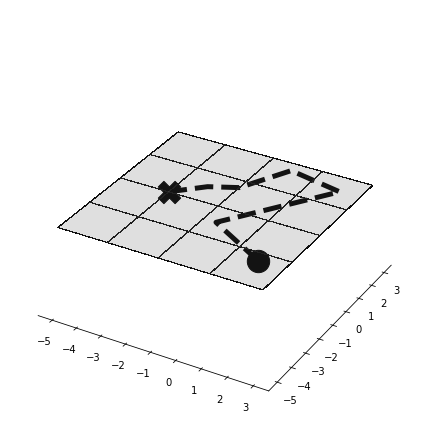

In [387]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure(figsize=(6, 6))
ax = fig.gca(projection='3d')
plt.grid(None)

# Make data.
X = np.arange(-5, 5, 2)
Y = np.arange(-5, 5, 2)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_wireframe(X, Y, np.zeros_like(Z), color='black', linewidth=.1, antialiased=False)
surf = ax.plot_surface(X, Y, np.zeros_like(Z), color='grey', alpha=0.2, linewidth=.1, antialiased=False)


ax.plot([-3, -2.5, -2, -1, 0, 2.2, -0.5, 2], [-1, -1/2, 0, 1/2, 2.5, 2, -2, -3.5], linewidth=5, color='black', linestyle='--')
ax.scatter([-3], [-1], s=500, marker='X', color='black')
ax.scatter([2], [-3.5], s=500, marker='o', color='black')

# Customize the z axis.
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.w_zaxis.line.set_lw(0.)
ax.set_zticks([])

plt.tight_layout()
plt.savefig("real.svg")
plt.show()

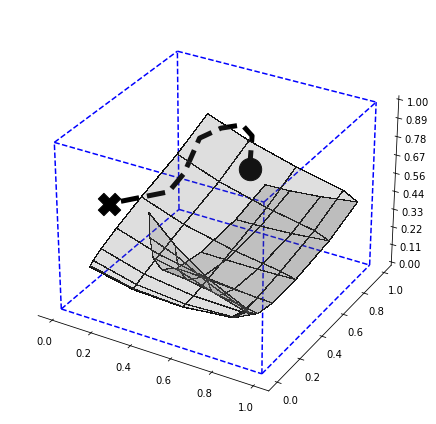

In [388]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

from itertools import combinations, product

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure(figsize=(6, 6))
ax = fig.gca(projection='3d')
plt.grid(None)

# Make data.
X = np.arange(0, 1.1, 0.15)
Y = np.arange(0, 1.1, 0.15)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = (1-np.sin(2 * R)) /2 + 1/4

# draw cube
r = [0, 1]
for s, e in combinations(np.array(list(product(r, r, r))), 2):
    if np.sum(np.abs(s-e)) == r[1]-r[0]:
        ax.plot3D(*zip(s, e), color="b", linestyle='--')


# Plot the surface.
surf = ax.plot_wireframe((np.clip(1 - np.sqrt(np.cos(np.exp(0.9 * Y)) ** 2), 0, 1)), np.clip(X ** 3, 0, 1), Z, color='black', linewidth=.1, antialiased=False)
surf = ax.plot_surface((np.clip(1 - np.sqrt(np.cos(np.exp(0.9 * Y)) ** 2), 0, 1)), np.clip(X ** 3, 0, 1), Z, color='grey', alpha=0.2, linewidth=.1, antialiased=False)


# Customize the z axis.
ax.set_zlim(0, 1.0)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.plot([0.6, 0.5, 0.45, 0.4, 0.35, 0.3, 0.25, 0.0], 
        [0.6, 0.8, 0.8, 0.7, 0.6, 0.55, 0.5, 0.4], 
        [0.7, 0.75, 0.8, 0.82, 0.8, 0.6, 0.5, 0.4],
        linewidth=5, color='black', linestyle='--')

ax.scatter(0.6, 0.6, 0.7, s=500, marker='o', color='black')
ax.scatter([0.0], [0.4], [0.4], s=500, marker='X', color='black')

plt.tight_layout()

plt.savefig('abstract.svg')
plt.show()